<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/SearchAndPlotInteractive/cellAtlasSearchAndPlot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Download Data**

In [ ]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [ ]:
#Kallisto bus clustered starvation data, h5ad (Trinity-processed data)
download_file('10.22002/D1.1796','.gz')

#Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing (raw)
download_file('10.22002/D1.1797','.gz')

#Previously saved neuron subpopulations
download_file('10.22002/D1.1804','.gz')



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1804.gz'

In [ ]:
!gunzip *.gz

### **Import Packages**

In [ ]:
!pip install --quiet anndata
!pip install --quiet scanpy

!pip install --quiet louvain

     |████████████████████████████████| 122kB 4.3MB/s 
     |████████████████████████████████| 10.2MB 4.6MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 71kB 7.7MB/s 
     |████████████████████████████████| 2.4MB 4.3MB/s 
     |████████████████████████████████| 3.2MB 49.0MB/s 
     |████████████████████████████████| 2.2MB 4.4MB/s 


In [ ]:
#Install Packages
import random
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")

### **Read in & make data for heatmap plotting/expression visualizations**

In [ ]:
#Read in h5ad file
bus_fs = anndata.read("D1.1796")
print(bus_fs)

raw_fs = anndata.read('D1.1797')

raw_fs = raw_fs[bus_fs.obs_names,]
#Transfer info from embedded version
raw_fs.obs['cellRanger_louvain'] = pd.Categorical(bus_fs.obs['cellRanger_louvain'])
raw_fs.obs['fed'] = pd.Categorical(bus_fs.obs['fed'])
raw_fs.obsm['X_tsne'] = bus_fs.obsm['X_tsne']

print(raw_fs)

#Previously saved neurons
neurons = anndata.read("D1.1804")

print(neurons)


Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'cellRanger_louvain', 'fed'
    obsm: 'X_tsne'
AnnData object with n_obs × n_vars = 1387 × 2000
    obs: 'batch', 'cellRanger_louvain', 'fed', 'n_counts', 'louvain_neur', 'test_

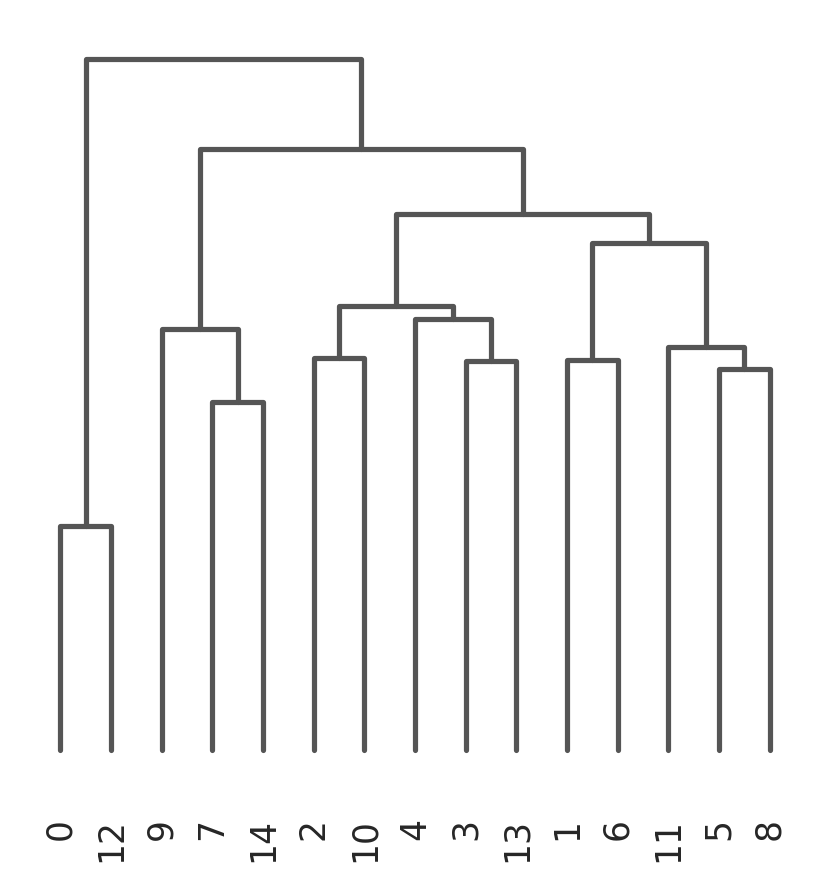

In [ ]:
#Dendrogram for neurons (so heatmap organized by clustering)
sc.tl.dendrogram(neurons,'louvain_neur',linkage_method='ward')
neurons.uns['dendrogram_louvain_neur'] = neurons.uns["dendrogram_['louvain_neur']"]
sc.pl.dendrogram(neurons,'louvain_neur')

In [ ]:
#Make neurons adata with all nonzero expression genes (not just highly variable ones)
neurons_raw = raw_fs[raw_fs.obs['cellRanger_louvain'].isin([31,26,6,9])]

sc.pp.filter_cells(neurons_raw, min_counts=0)
sc.pp.filter_genes(neurons_raw, min_counts=0)

sc.pp.normalize_per_cell(neurons_raw, counts_per_cell_after=1e4)

sc.pp.log1p(neurons_raw)

#Transfer necessary labels to adata object
neurons_raw.obs['louvain_neur'] = neurons.obs['louvain_neur']
neurons_raw.obsm['X_tsne'] = neurons.obsm['X_tsne']
neurons_raw.obsm['X_umap'] = neurons.obsm['X_umap']

neurons_raw.uns['dendrogram_louvain_neur'] = neurons.uns['dendrogram_louvain_neur']
neurons_raw.uns['louvain_neur_colors'] = neurons.uns['louvain_neur_colors']

neurons_raw

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 1387 × 46716
    obs: 'batch', 'cellRanger_louvain', 'fed', 'n_counts', 'louvain_neur'
    var: 'n_counts'
    uns: 'log1p', 'dendrogram_louvain_neur', 'louvain_neur_colors'
    obsm: 'X_tsne', 'X_umap'

Set list(s) of genes to plot

In [ ]:
#Set list of genes to plot
genes = ['XLOC_000520','XLOC_001911','XLOC_002105','XLOC_002272','XLOC_004165','XLOC_005609','XLOC_006072','XLOC_006965',
'XLOC_007437','XLOC_008632','XLOC_008858','XLOC_009978','XLOC_010708','XLOC_011101','XLOC_015554','XLOC_017845',
'XLOC_019434','XLOC_021506','XLOC_029205','XLOC_029929','XLOC_029934','XLOC_030379','XLOC_031872','XLOC_033751',
'XLOC_034427','XLOC_036006','XLOC_038183','XLOC_038345','XLOC_042133','XLOC_042542','XLOC_030971' , 'XLOC_004785','XLOC_033801','XLOC_007915']

#Filter for gene names in annotation
inRaw = [i for i in genes if i in list(neurons_raw.var_names)]
notInRaw = [i for i in genes if i not in list(neurons_raw.var_names)]
print('Genes not in annotation: ',notInRaw)

Genes not in annotation:  []


Plot gene expression across NEURON SUBPOPULATIONS

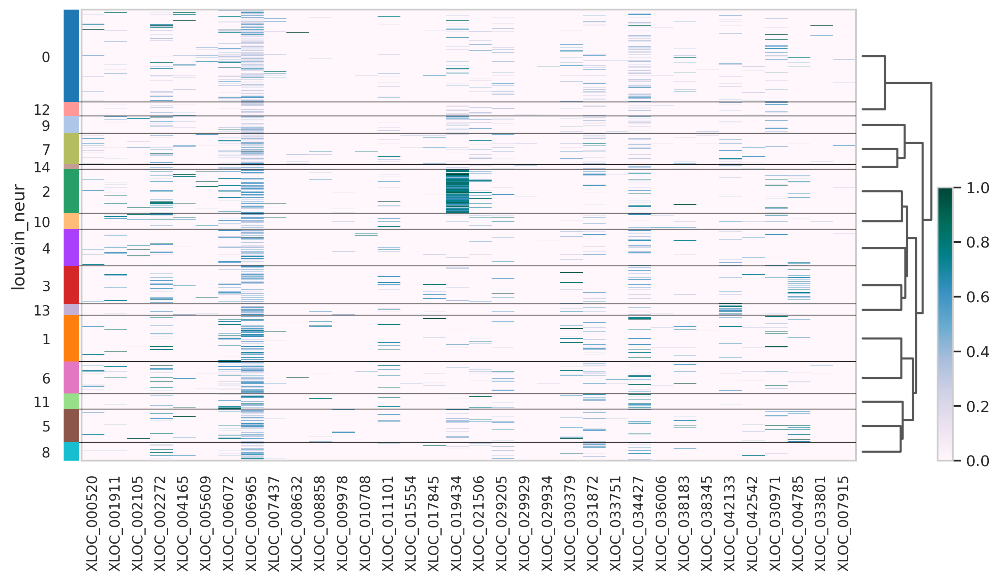

In [ ]:
#Plot heatmap for genes in NEURON SUBPOPULATIONS
toPlot = neurons_raw[:,inRaw]
sc.pl.heatmap(toPlot, inRaw, groupby='louvain_neur', dendrogram=True,show_gene_labels=True,
              cmap='PuBuGn',standard_scale='var')

Plot gene expression across CELL ATLAS

In [ ]:
#Plot gene expression in CELL ATLAS

raw_fs.obs['new_cellRanger_louvain'] = bus_fs.obs['new_cellRanger_louvain']
raw_fs.uns["dendrogram_new_cellRanger_louvain"] = bus_fs.uns["dendrogram_new_cellRanger_louvain"]
raw_fs.uns['new_cellRanger_louvain_colors'] = bus_fs.uns['new_cellRanger_louvain_colors']

raw_fs.obsm['X_umap'] = bus_fs.obsm['X_umap']

#Log values in adata
toPlot = raw_fs.copy()
sc.pp.log1p(toPlot)


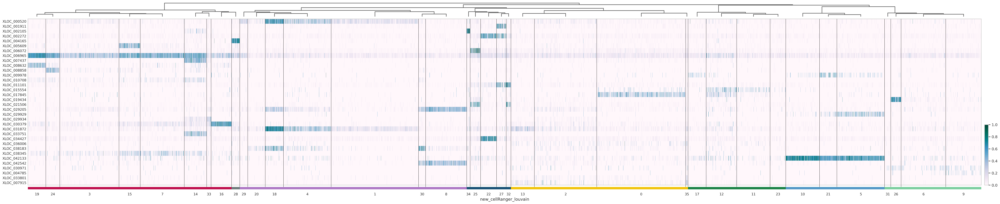

In [ ]:
#Plot gene expression on heatmap across cell types
sc.pl.heatmap(toPlot, inRaw, groupby='new_cellRanger_louvain',dendrogram=True, show_gene_labels=True,swap_axes=True,figsize = (50,10),
              cmap='PuBuGn',standard_scale='var')

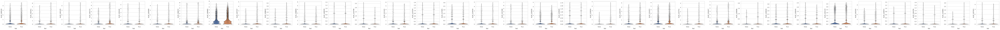

In [ ]:
#Plot gene expression as violin plots
sc.pl.violin(toPlot, keys=inRaw, groupby='fed')

Plot genes on Neural UMAP (2D Embedding) (Neural Subpopulations)

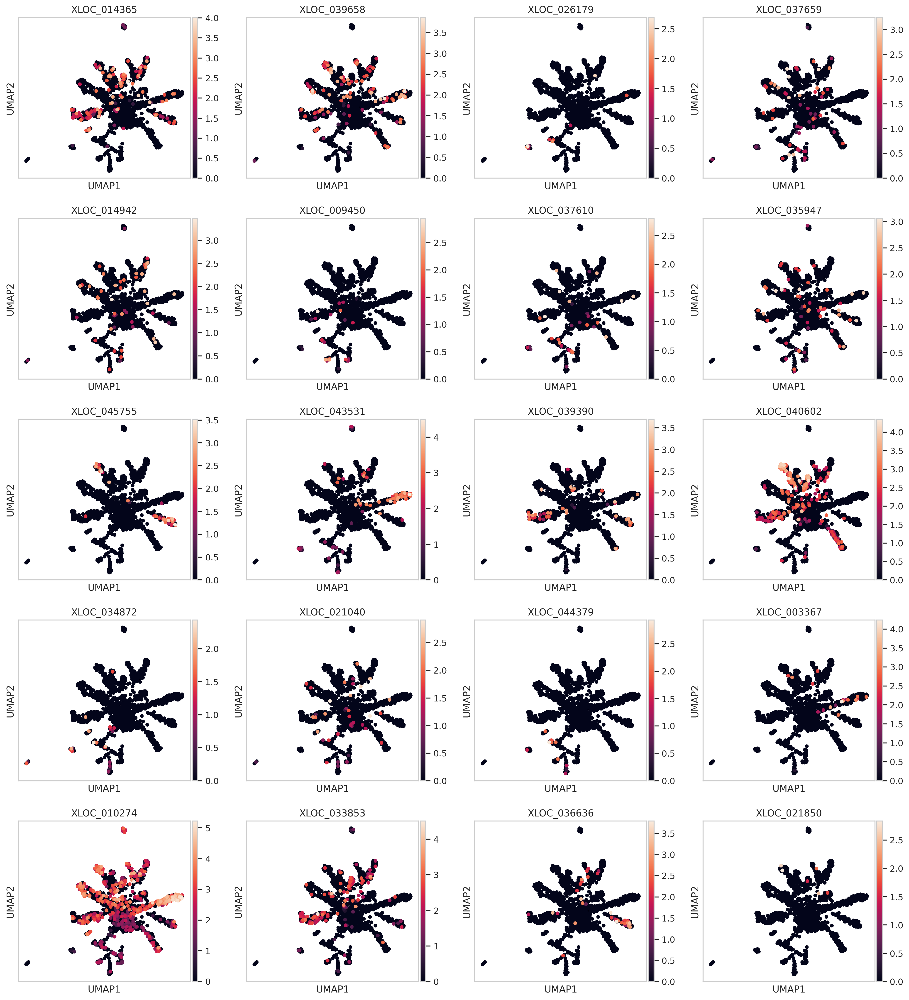

In [ ]:
#Neuron subpopulations
sc.pl.umap(neurons_raw,color=inRaw)

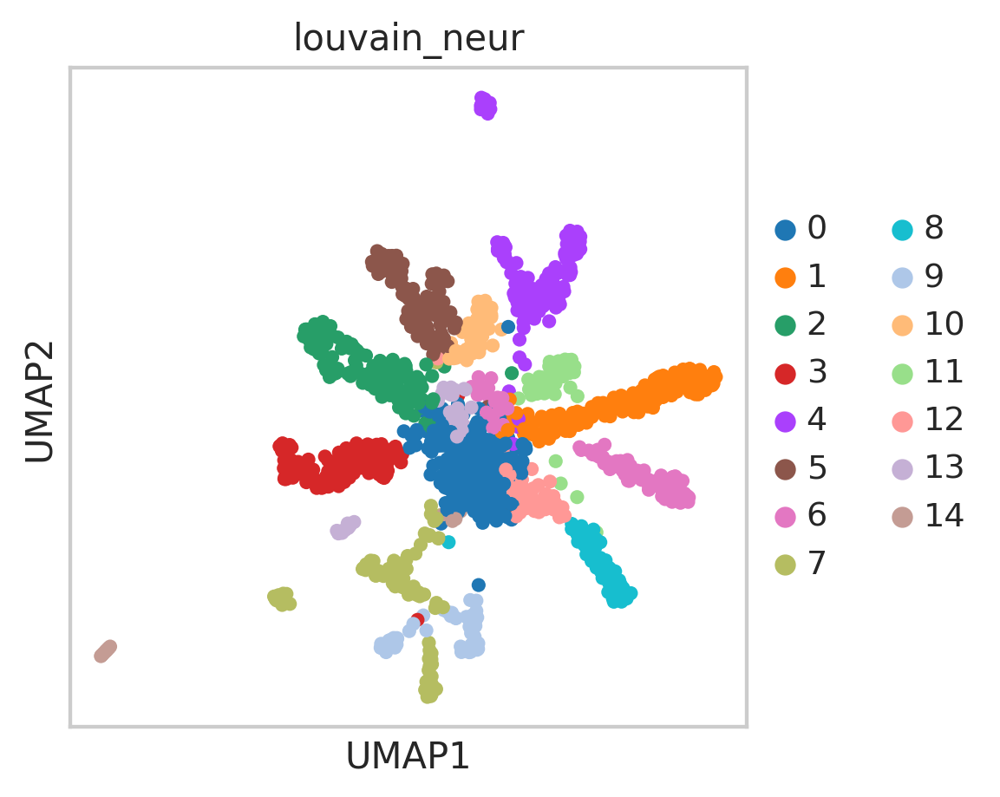

In [ ]:
#See neuron subpopulations
sc.pl.umap(neurons_raw,color=['louvain_neur'])

Plot genes on Cell Atlas UMAP (2D Embedding)

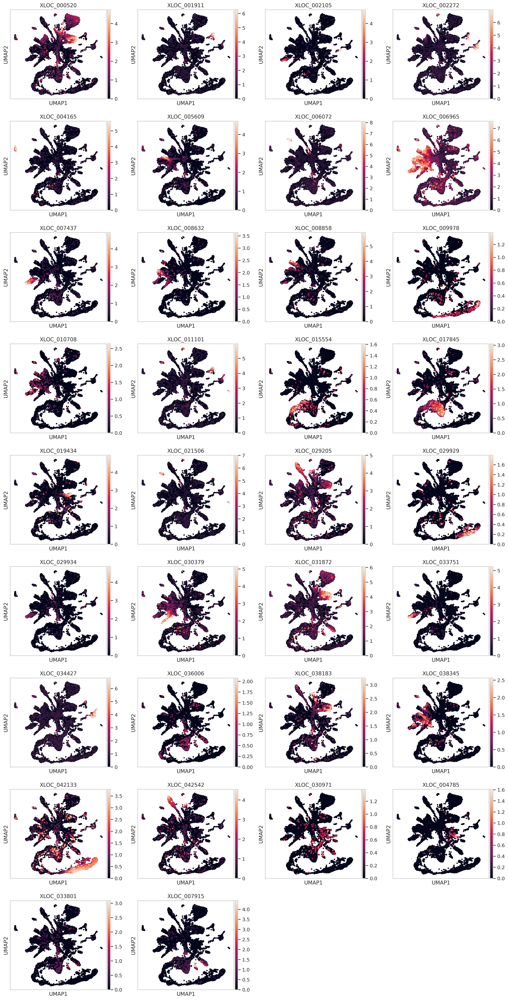

In [ ]:
#Cell Atlas
sc.pl.umap(toPlot,color=inRaw,s=40,save='umaps.pdf')

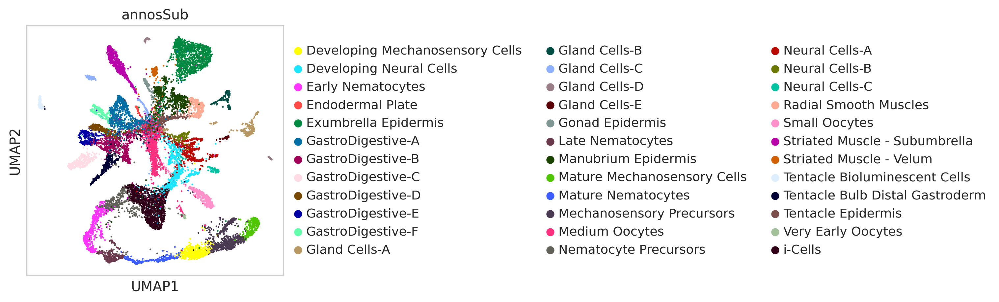

In [ ]:
#See Cell Atlas populations
raw_fs.obs['annosSub'] = bus_fs.obs['annosSub']
sc.pl.umap(raw_fs,color=['annosSub'])